In [49]:
import scvi
import scanpy as sc
import pandas as pd

sc.set_figure_params(figsize=(8, 8))

In [9]:
adata = sc.read_h5ad("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/anndata.h5ad")

In [11]:
# preprocessing
sc.pp.filter_genes(adata, min_counts=3)
adata.layers["counts"] = adata.X.copy() # preserve counts
adata.raw = adata # freeze the state in `.raw`

sc.pp.highly_variable_genes(
    adata,
    n_top_genes=2500,
    subset=True,
    layer="counts",
    flavor="cell_ranger",
    batch_key="exp"
)

/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:475: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:475: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/scanpy/preprocessing/_highly_variable_genes.py:475: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hvg = hvg.append(missing_hvg, ignore_index=True)
/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/scanpy/preprocessing/_highly

In [4]:
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    batch_key="exp",
    categorical_covariate_keys=["stage", "sample"]
)

INFO     Using batches from adata.obs["exp"]                                                 
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Successfully registered anndata object containing 39728 cells, 2500 vars, 2 batches,
         1 labels, and 0 proteins. Also registered 2 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/scvi/data/_anndata.py:315: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  warnings.warn(


In [5]:
model = scvi.model.SCVI(adata, n_latent=20)

In [6]:
model.train()

GPU available: False, used: False
TPU available: False, using: 0 TPU cores
Set SLURM handle signals.


Epoch 201/201: 100%|██████████| 201/201 [1:21:46<00:00, 24.41s/it, loss=350, v_num=1]


In [7]:
model.save("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_20/")

In [51]:
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    batch_key="exp",
    categorical_covariate_keys=["stage"]
)
model = scvi.model.SCVI(adata, n_latent=20)
model.train()
model.save("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_no_sample_20/")

INFO     Using batches from adata.obs["exp"]                                                 
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Successfully registered anndata object containing 39728 cells, 2500 vars, 2 batches,
         1 labels, and 0 proteins. Also registered 1 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/scvi/data/_anndata.py:315: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  warnings.warn(
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
Set SLURM handle signals.


Epoch 201/201: 100%|██████████| 201/201 [1:18:21<00:00, 23.39s/it, loss=354, v_num=1]


ValueError: /rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_no_sample_20/ already exists. Please provide an unexisting directory for saving.

In [84]:
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    batch_key="exp",
    categorical_covariate_keys=["stage", "sample"]
)
model = scvi.model.SCVI(adata, n_latent=15)
model.train()
model.save("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_15/")

INFO     Using batches from adata.obs["exp"]                                                 
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Successfully registered anndata object containing 39728 cells, 2500 vars, 2 batches,
         1 labels, and 0 proteins. Also registered 2 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/scvi/data/_anndata.py:315: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  warnings.warn(
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
Set SLURM handle signals.


Epoch 201/201: 100%|██████████| 201/201 [1:17:07<00:00, 23.02s/it, loss=353, v_num=1]


In [5]:
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    batch_key="exp",
    categorical_covariate_keys=["stage"]
)
model = scvi.model.SCVI(adata, n_latent=15)
model.train()
model.save("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_no_sample_15/")

INFO     Using batches from adata.obs["exp"]                                                 
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Successfully registered anndata object containing 39728 cells, 2500 vars, 2 batches,
         1 labels, and 0 proteins. Also registered 1 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/scvi/data/_anndata.py:315: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  warnings.warn(
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
Set SLURM handle signals.


Epoch 201/201: 100%|██████████| 201/201 [1:15:36<00:00, 22.57s/it, loss=357, v_num=1]


In [14]:
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    batch_key="exp",
    categorical_covariate_keys=["stage", "sample"]
)
model = scvi.model.SCVI(adata, n_latent=30)
model.train()
model.save("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_30/")

INFO     Using batches from adata.obs["exp"]                                                 
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Successfully registered anndata object containing 39728 cells, 2500 vars, 3 batches,
         1 labels, and 0 proteins. Also registered 2 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/scvi/data/_anndata.py:315: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  warnings.warn(
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
Set SLURM handle signals.


Epoch 201/201: 100%|██████████| 201/201 [1:16:09<00:00, 22.73s/it, loss=577, v_num=1]


ValueError: /rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_30/ already exists. Please provide an unexisting directory for saving.

In [15]:
model.save("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_30_2/")

In [36]:
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    batch_key="exp",
    categorical_covariate_keys=["stage"]
)
model = scvi.model.SCVI(adata, n_latent=30)
model.train()
model.save("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_no_sample_30/")

INFO     Using batches from adata.obs["exp"]                                                 
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.layers["counts"]                                              
INFO     Successfully registered anndata object containing 39728 cells, 2500 vars, 3 batches,
         1 labels, and 0 proteins. Also registered 1 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/scvi/data/_anndata.py:315: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  warnings.warn(
GPU available: False, used: False
TPU available: False, using: 0 TPU cores
Set SLURM handle signals.


Epoch 201/201: 100%|██████████| 201/201 [1:20:00<00:00, 23.88s/it, loss=558, v_num=1]


ValueError: /rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_no_sample_30/ already exists. Please provide an unexisting directory for saving.

In [38]:
model.save("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_no_sample_30_2/")

# Inspect

In [62]:
model = scvi.model.SCVI.load("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_20/", adata)

INFO     Using data from adata.layers["counts"]                                              
INFO     Registered keys:['X', 'batch_indices', 'labels', 'cat_covs']                        
INFO     Successfully registered anndata object containing 39728 cells, 2500 vars, 2 batches,
         1 labels, and 0 proteins. Also registered 2 extra categorical covariates and 0 extra
         continuous covariates.                                                              


/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function transfer_anndata_setup is deprecated; This method will be removed in 0.15.0. Please avoid building any new dependencies on it.
  warnings.warn(msg, category=FutureWarning)
/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/scvi/data/_anndata.py:315: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  warnings.warn(


In [63]:
latent = model.get_latent_representation()
adata.obsm["X_scVI"] = latent
adata.layers["scvi_normalized"] = model.get_normalized_expression(
    library_size=10e4
)

In [75]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_scVI", n_neighbors=35)
sc.tl.umap(adata, min_dist=0.2)

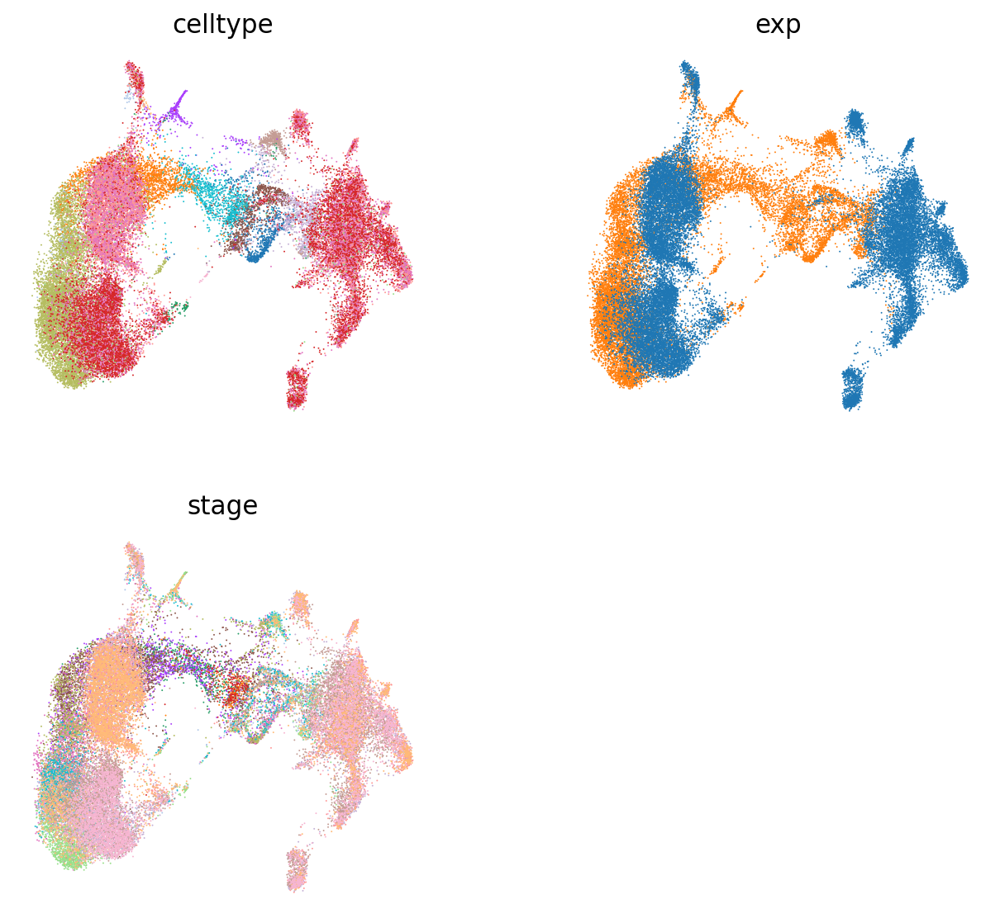

In [76]:
sc.pl.umap(
    adata,
    color=["celltype", "exp", "stage"],
    frameon=False,
    ncols=2, legend_loc='none'
)

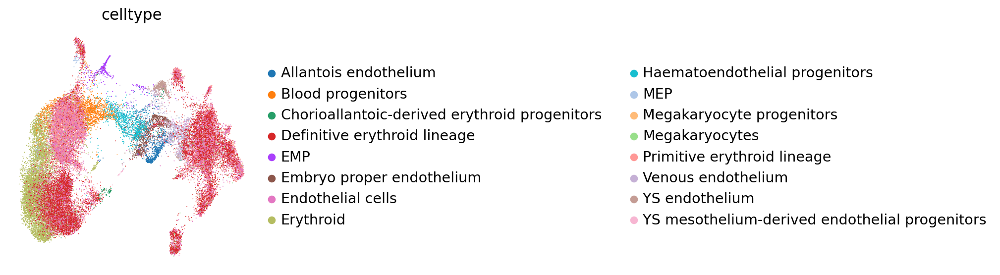

In [77]:
sc.pl.umap(
    adata,
    color=["celltype"],
    frameon=False,
    ncols=2
)

INFO     Using data from adata.layers["counts"]                                              
INFO     Registered keys:['X', 'batch_indices', 'labels', 'cat_covs']                        
INFO     Successfully registered anndata object containing 39728 cells, 2500 vars, 2 batches,
         1 labels, and 0 proteins. Also registered 1 extra categorical covariates and 0 extra
         continuous covariates.                                                              


/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function transfer_anndata_setup is deprecated; This method will be removed in 0.15.0. Please avoid building any new dependencies on it.
  warnings.warn(msg, category=FutureWarning)
/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/scvi/data/_anndata.py:315: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  warnings.warn(


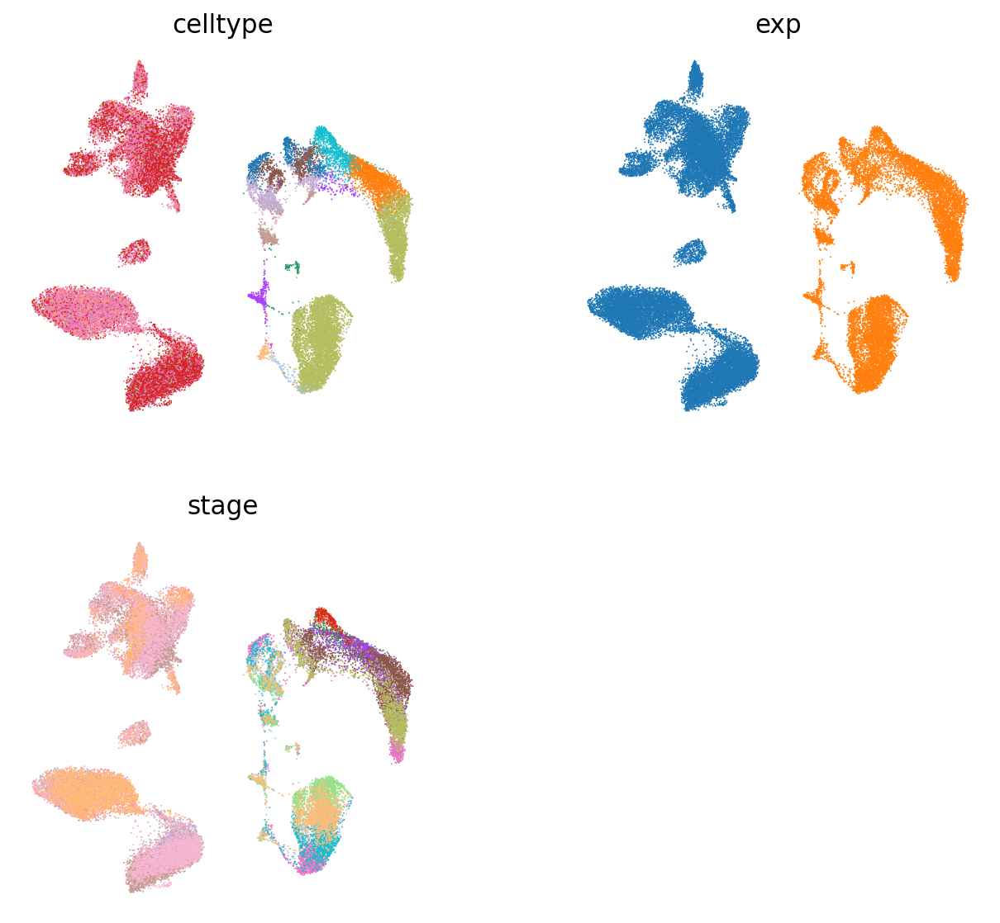

In [61]:
model = scvi.model.SCVI.load("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_no_sample_20/", adata)

latent = model.get_latent_representation()
adata.obsm["X_scVI"] = latent
adata.layers["scvi_normalized"] = model.get_normalized_expression(
    library_size=10e4
)

# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_scVI", n_neighbors=35)
sc.tl.umap(adata, min_dist=0.4)

sc.pl.umap(
    adata,
    color=["celltype", "exp", "stage"],
    frameon=False,
    ncols=2, legend_loc='none'
)

In [12]:
model = scvi.model.SCVI.load("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_15/", adata)

latent = model.get_latent_representation()
adata.obsm["X_scVI"] = latent
adata.layers["scvi_normalized"] = model.get_normalized_expression(
    library_size=10e4
)

# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_scVI", n_neighbors=35)
sc.tl.umap(adata, min_dist=0.4)

sc.pl.umap(
    adata,
    color=["celltype", "exp", "stage"],
    frameon=False,
    ncols=2, legend_loc='none'
)

/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/scvi/model/base/_utils.py:84: UserWarning: var_names for adata passed in does not match var_names of adata used to train the model. For valid results, the vars need to be the same and in the same order as the adata used to train the model.
  warnings.warn(
/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function transfer_anndata_setup is deprecated; This method will be removed in 0.15.0. Please avoid building any new dependencies on it.
  warnings.warn(msg, category=FutureWarning)


ValueError: Making .obs["exp"] categorical failed. Expected categories: ['cao' 'extended']. Received categories: Index(['blanca', 'cao', 'ext'], dtype='object'). 

INFO     Using data from adata.layers["counts"]                                              


/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function transfer_anndata_setup is deprecated; This method will be removed in 0.15.0. Please avoid building any new dependencies on it.
  warnings.warn(msg, category=FutureWarning)


INFO     Registered keys:['X', 'batch_indices', 'labels', 'cat_covs']                        
INFO     Successfully registered anndata object containing 39728 cells, 2500 vars, 3 batches,
         1 labels, and 0 proteins. Also registered 2 extra categorical covariates and 0 extra
         continuous covariates.                                                              


/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/scvi/data/_anndata.py:315: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  warnings.warn(


Epoch 1/201:   0%|          | 0/201 [1:30:45<?, ?it/s]


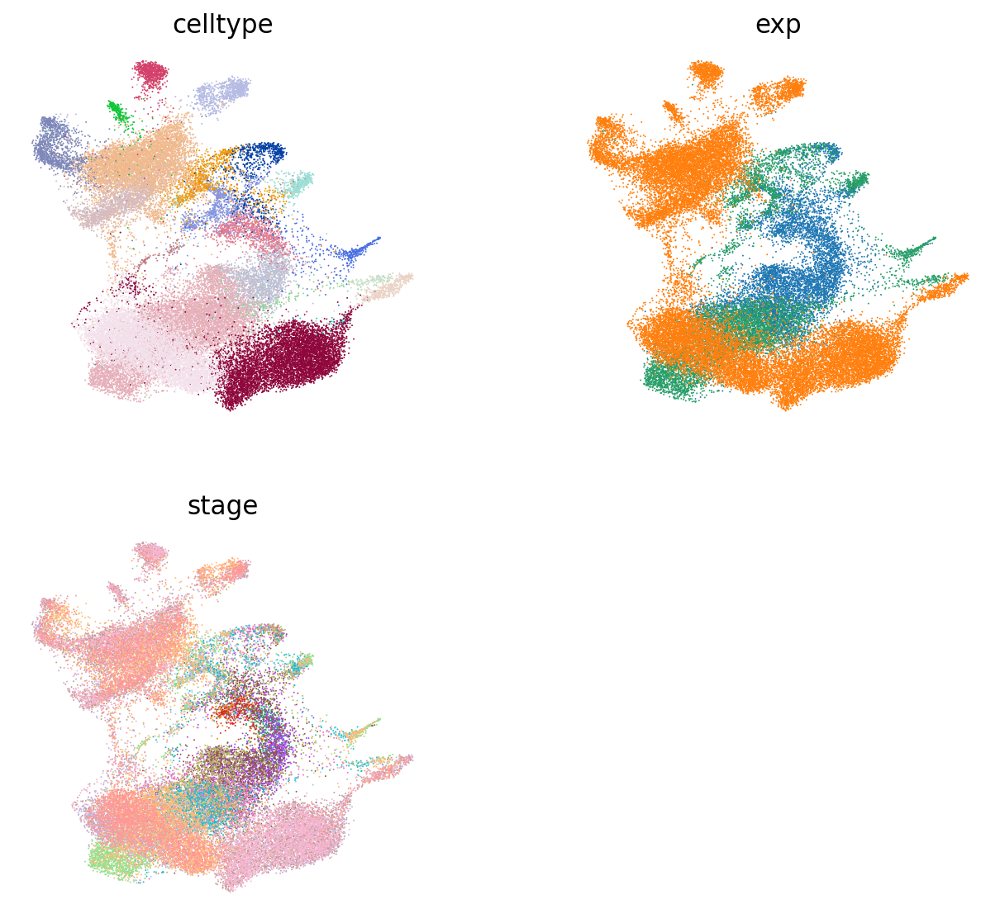

In [20]:
model = scvi.model.SCVI.load("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_30_2/", adata)

latent = model.get_latent_representation()
adata.obsm["X_scVI"] = latent
adata.layers["scvi_normalized"] = model.get_normalized_expression(
    library_size=10e4
)

# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_scVI", n_neighbors=35)
sc.tl.umap(adata, min_dist=0.4)

sc.pl.umap(
    adata,
    color=["celltype", "exp", "stage"],
    frameon=False,
    ncols=2, legend_loc='none'
)

INFO     Using data from adata.layers["counts"]                                              


/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function transfer_anndata_setup is deprecated; This method will be removed in 0.15.0. Please avoid building any new dependencies on it.
  warnings.warn(msg, category=FutureWarning)


INFO     Registered keys:['X', 'batch_indices', 'labels', 'cat_covs']                        
INFO     Successfully registered anndata object containing 39728 cells, 2500 vars, 3 batches,
         1 labels, and 0 proteins. Also registered 1 extra categorical covariates and 0 extra
         continuous covariates.                                                              


/home/bt392/miniconda3/envs/env_scvi2/lib/python3.9/site-packages/scvi/data/_anndata.py:315: UserWarning: Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.
  warnings.warn(


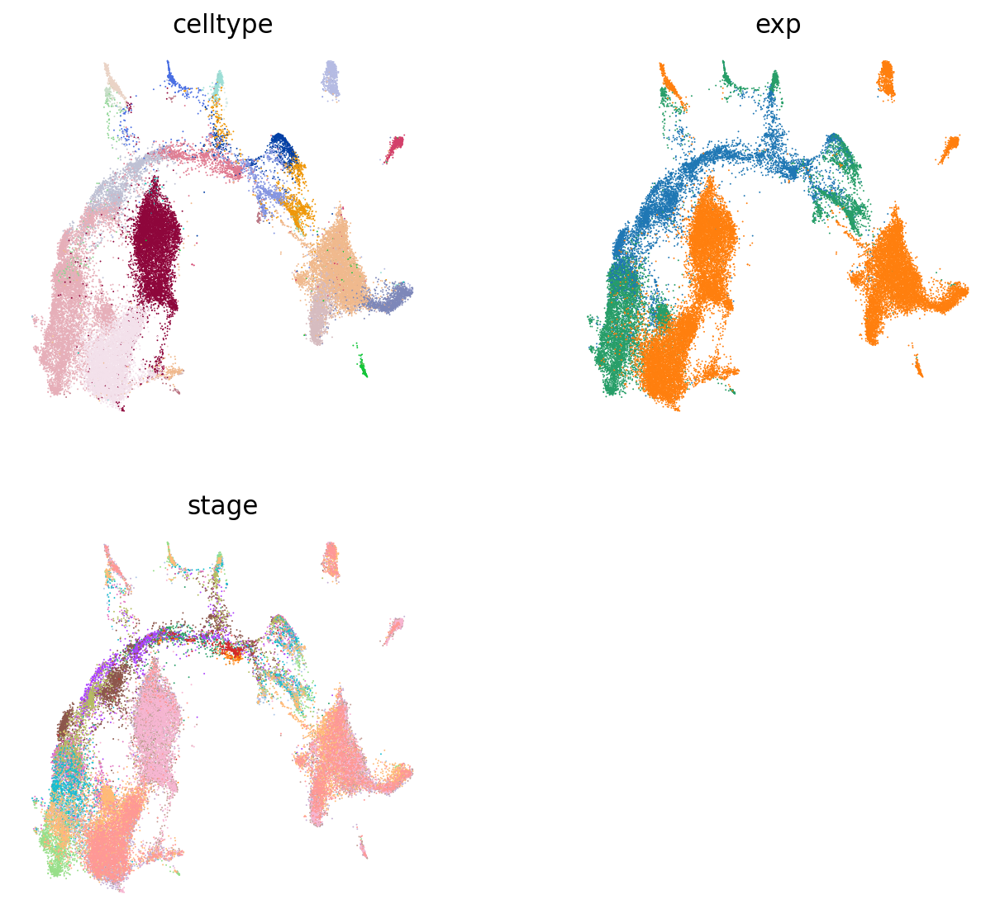

In [48]:
model = scvi.model.SCVI.load("/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/Erythroid/processed/scvi_model_no_sample_30_2/", adata)

latent = model.get_latent_representation()
adata.obsm["X_scVI"] = latent
adata.layers["scvi_normalized"] = model.get_normalized_expression(
    library_size=10e4
)

# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_scVI", n_neighbors=15)
sc.tl.umap(adata, min_dist=0.1)

sc.pl.umap(
    adata,
    color=["celltype", "exp", "stage"],
    frameon=False,
    ncols=2, legend_loc='none'
)

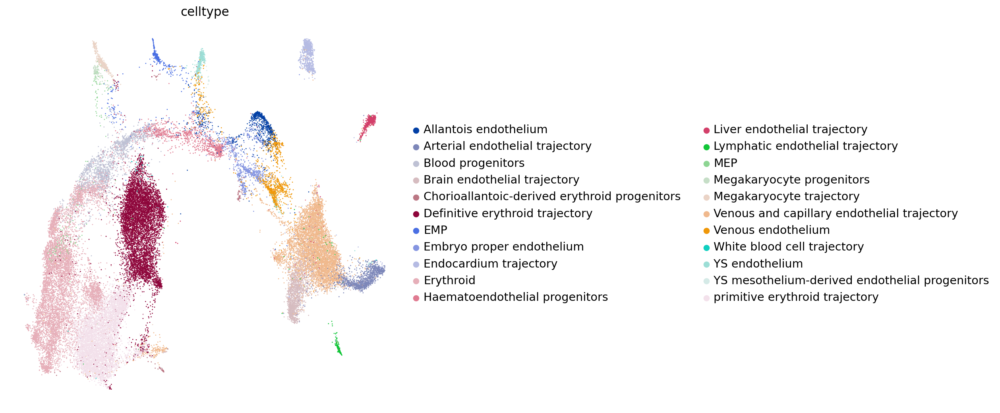

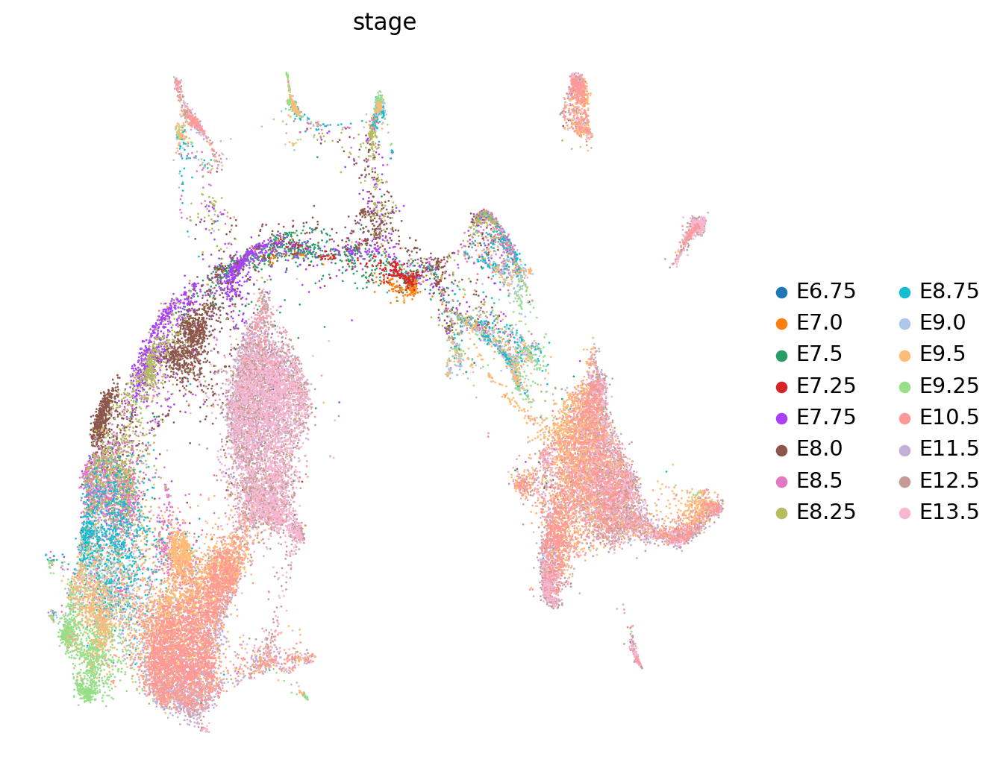

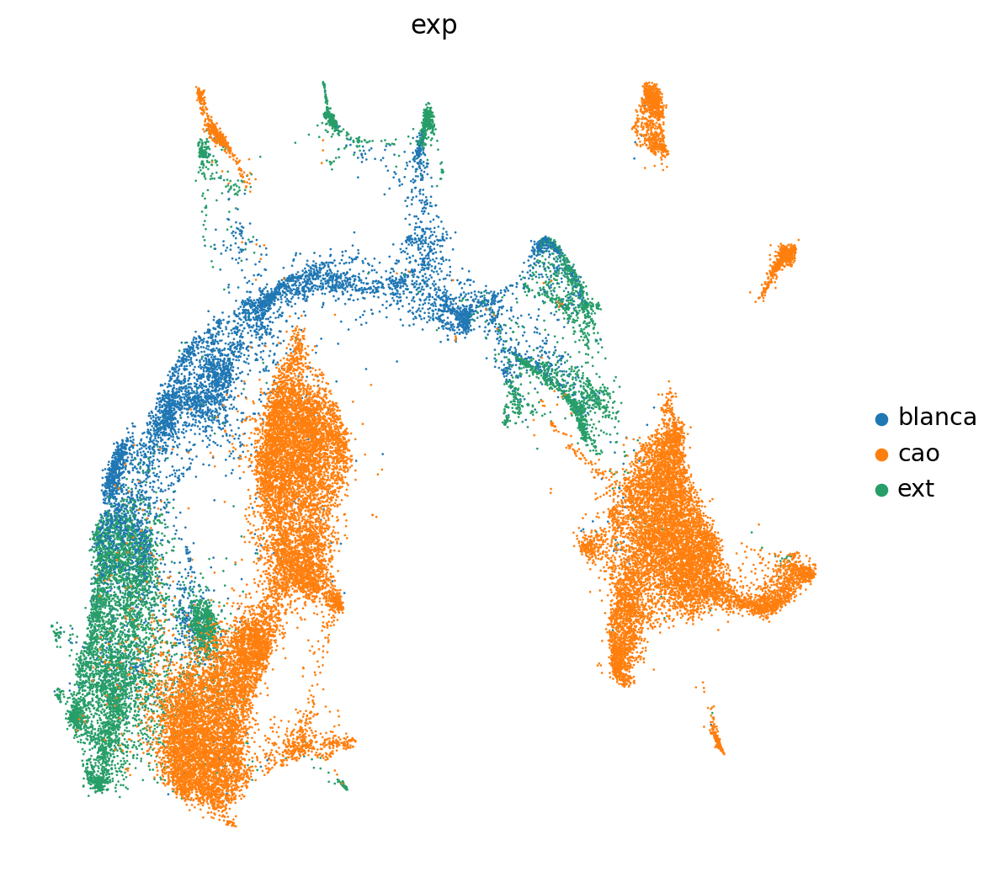

In [57]:
sc.pl.umap(
    adata,
    color=["celltype"],
    frameon=False,
    size=6
)
sc.pl.umap(
    adata,
    color=["stage"],
    frameon=False,
    size=6
)
sc.pl.umap(
    adata,
    color=["exp"],
    frameon=False,
    size=6
)

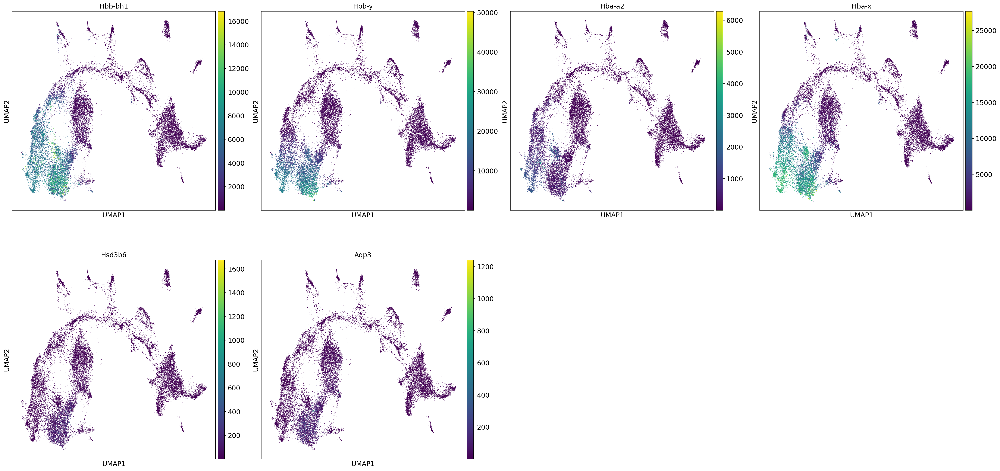

In [58]:
# Primitive erythroid markers
gene = ['Hbb-bh1','Hbb-y',  'Hba-a2', 'Hba-x', 'Hsd3b6', 'Aqp3']
sc.pl.umap(adata, color=gene, layer="scvi_normalized")

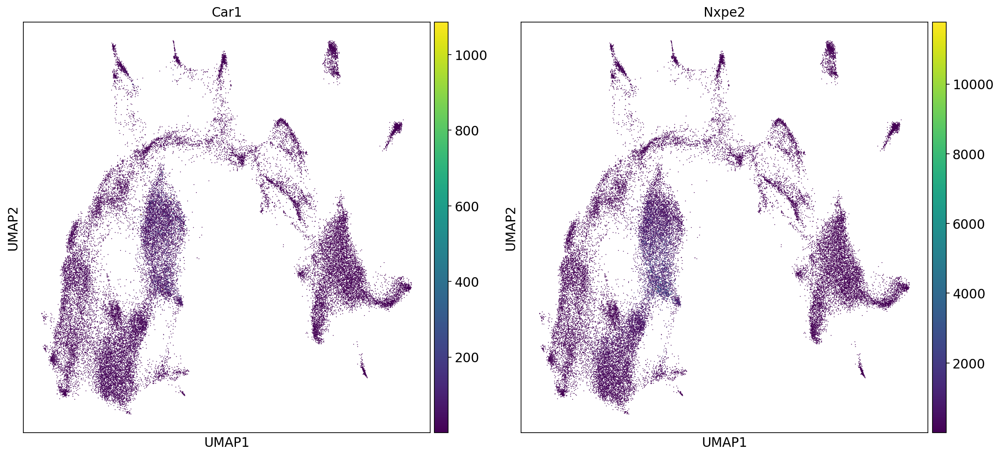

In [59]:
# Def marker
gene = ['Car1', 'Nxpe2']
sc.pl.umap(adata, color=gene, layer="scvi_normalized")

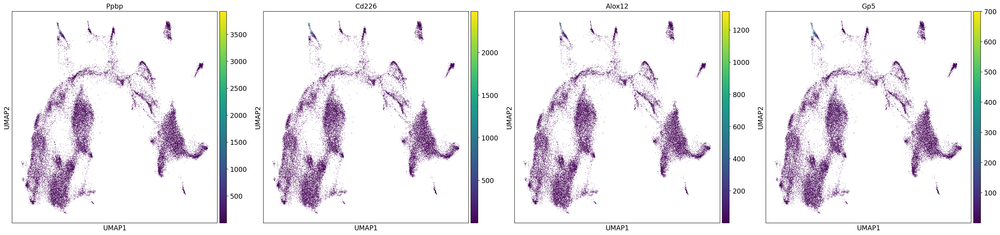

In [60]:
# megakaryocyte marker
gene = ['Ppbp', 'Cd226', 'Alox12', 'Gp5']
sc.pl.umap(adata, color=gene, layer="scvi_normalized")

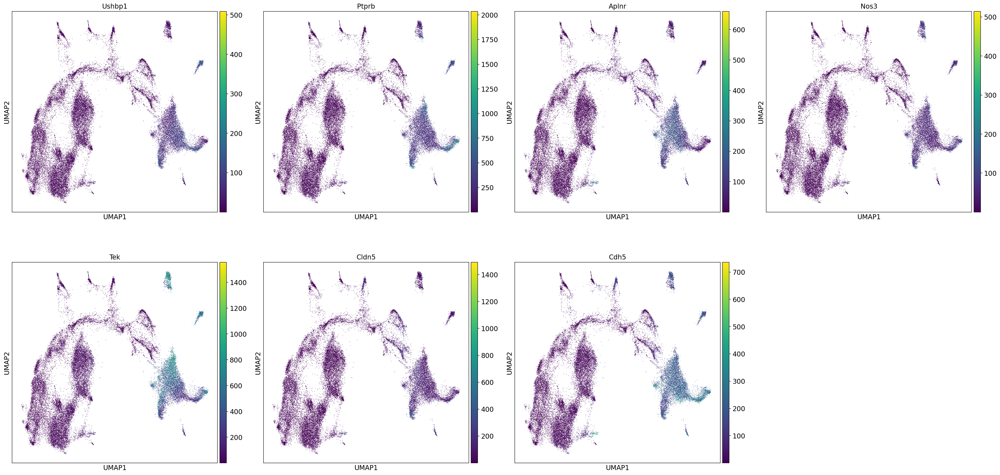

In [61]:
# Endothelial marker
gene = ['Ushbp1', 'Ptprb', 'Aplnr', 'Nos3', 'Tek', 'Cldn5', 'Cdh5']
sc.pl.umap(adata, color=gene, layer="scvi_normalized")

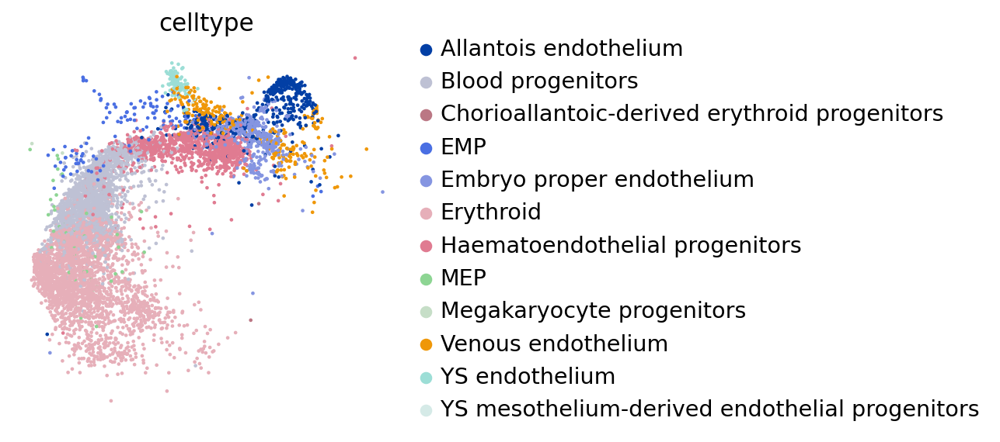

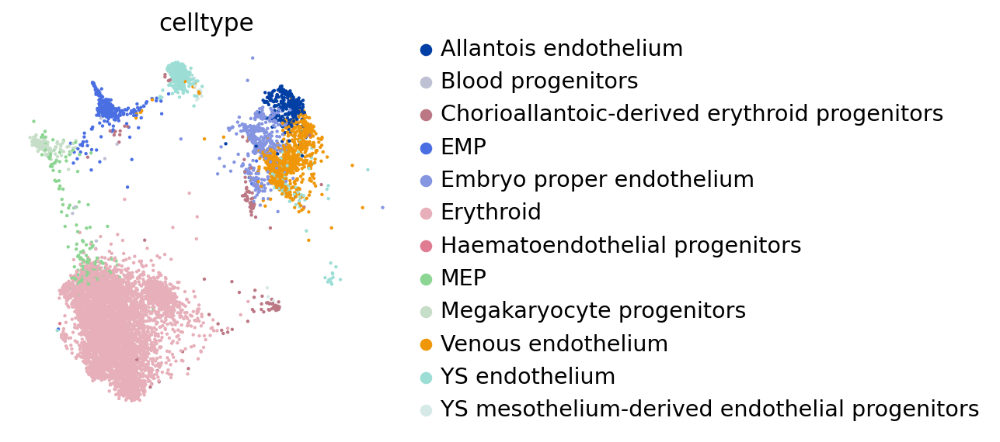

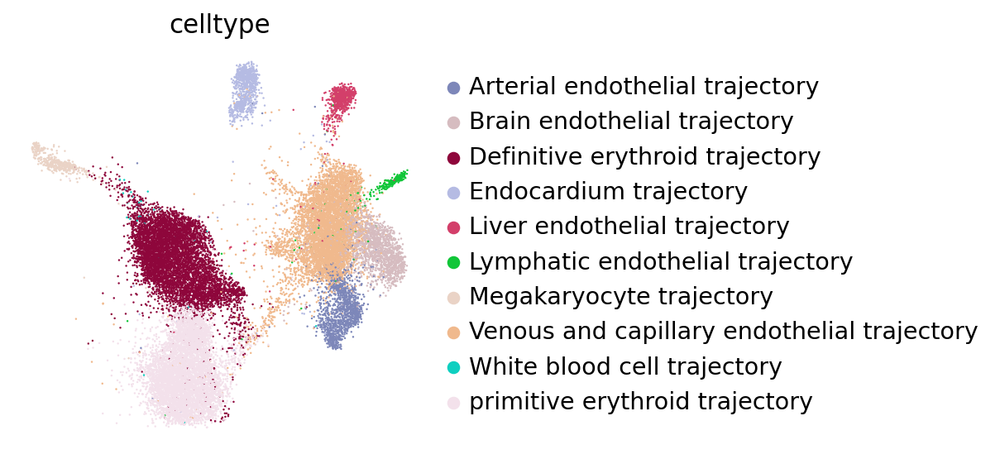

In [45]:
sc.pl.umap(
    adata[adata.obs.exp=='blanca'],
    color=["celltype"],
    frameon=False,
    ncols=2
)
sc.pl.umap(
    adata[adata.obs.exp=='ext'],
    color=["celltype"],
    frameon=False,
    ncols=2
)

sc.pl.umap(
    adata[adata.obs.exp=='cao'],
    color=["celltype"],
    frameon=False,
    ncols=2
)

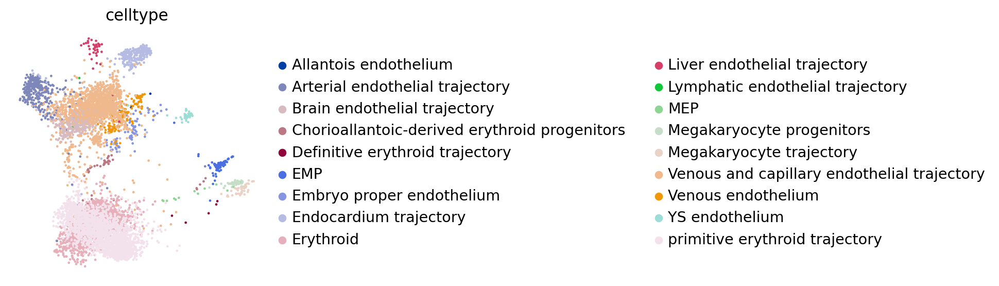

In [35]:
sc.pl.umap(
    adata[adata.obs.stage=='E9.5'],
    color=["celltype"],
    frameon=False,
    ncols=2
)